In [1]:
err_msg = "/data/scsgpu1/work/jeffwang/dark_pattern/err_msg.json"

In [2]:
import json
import numpy as np

from PIL import Image
import cv2 
from IPython.display import display

from utils import *
from models import *
from dataset import *

/home/wan167/work/UIST23-UIGuard/DL_UIGuard/envs/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/wan167/work/UIST23-UIGuard/DL_UIGuard/envs/lib/python3.9/site-packages/transformers/utils/hub.py:124: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


In [3]:
RICO_DATASET_ROOT = "/data/scsgpu1/work/jeffwang/dark_pattern/rico_testset"
RICO_DATASET_DETECTION = f"{RICO_DATASET_ROOT}/detection"
RICO_DATASET_IMG_TEXT = f"{RICO_DATASET_DETECTION}/text"
RICO_DATASET_PROC_DATA = f"{RICO_DATASET_DETECTION}/proc_dataset.pk"

OUR_DATASET_ROOT = "/data/scsgpu1/work/jeffwang/dark_pattern/our_labelling"
OUR_DATASET_DETECTION = f"{OUR_DATASET_ROOT}/detection"
OUR_DATASET_IMG_TEXT = f"{OUR_DATASET_DETECTION}/text"
OUR_DATASET_PROC_DATA = f"{OUR_DATASET_DETECTION}/proc_dataset.pk"

In [4]:
rico_train_set, rico_test_set, rico_labels, max_seq_length_1 = load_dataset(
    RICO_DATASET_IMG_TEXT, RICO_DATASET_PROC_DATA, RICO_DATASET_ROOT
)
our_train_set, our_test_set, our_labels, max_seq_length_2 = load_dataset(
    OUR_DATASET_IMG_TEXT, OUR_DATASET_PROC_DATA, OUR_DATASET_ROOT
)
max_seq_length = max([max_seq_length_1, max_seq_length_2])
total_labels = our_labels + [label_map[l] for l in rico_labels]
total_labels = list(set(total_labels))
tatal_labels = sorted(total_labels)

In [5]:
bert_resnet_model = Bert_ResNet(
        n_channels=3, n_class=len(tatal_labels), n_layers=50
    )
tokenizer = bert_resnet_model.tokenizer

/home/wan167/work/UIST23-UIGuard/DL_UIGuard/envs/lib/python3.9/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [6]:
rico_test_set = one_hot_vector(rico_test_set, tatal_labels)
our_test_set = one_hot_vector(our_test_set, tatal_labels)
all_test_set = our_test_set

com.soundcloud.android_6_3.png
com.soundcloud.android_7_4.png
com.soundcloud.android_8_5.png
com.spotify.music_1_1.png
com.spotify.music_2_2.png
com.spotify.music_3_step-1--g0a17-1693336145102.png
com.spotify.music_4_step-120--g0a227-1693336291825.png
com.streema.simpleradio_13_step-6--g0a10-1694564868672.png
com.streema.simpleradio_9_step-4--g0a23-1694564862496.png
com.tumblr_0_3.png
com.twitter.android_4_2.png
com.twitter.android_5_0.png
com.twitter.android_6_2.png
com.twitter.android_9_step-80--g0a169-1693239671262.png
com.virginaustralia.vaapp_0_1.png
com.washingtonpost.android_3_1.png
com.wonder_6_0.png
com.zulily.android_1_10.png
com.zzkko_10_5.png
deezer.android.app_8_step-37--g0a157-1694571986305.png
flipboard.app_0_2.png
flipboard.app_2_6.png
fm.castbox.audiobook.radio.podcast_0_0.png
fm.castbox.audiobook.radio.podcast_1_10.png
jp.naver.line.android_1_4.png
jp.naver.line.android_2_step-74--g0a160-1693728040948.png
photoeditor.layout.collagemaker_0_0.png
photoeditor.layout.coll

In [7]:
test_dataset = CustomDataset(all_test_set, tokenizer, max_seq_length)

In [8]:
with open(err_msg, 'r') as f:
    idx_y_bars = json.load(f)

In [9]:
class_errors = {}
for idx, y_bar in idx_y_bars:
    gth = np.argmax(test_dataset[idx][1])
    gth = tatal_labels[gth]
    if gth in class_errors:
        class_errors[gth].append([idx, y_bar])
    else:
        class_errors[gth] = [[idx, y_bar]]


In [10]:
class_errors_counts = {l:len(v) for l, v in class_errors.items()}

In [11]:
class_errors_counts

{'Nagging': 15,
 'II-Preselection': 10,
 'II-HiddenInformation': 4,
 'II-AM-FalseHierarchy-BAD': 3,
 'Obstruction-Currency': 2,
 'Sneaking-BaitAndSwitch': 9,
 'ForcedAction-General': 4,
 'II-AM-DisguisedAD': 12,
 'II-AM-ToyingWithEmotion': 4,
 'II-AM-General': 3,
 'Sneaking-ForcedContinuity': 3}

In [12]:
color = (255,0,0)
def print_err_img(gth_name = 'II-AM-DisguisedAD', n=3):
    for idx, y_bar in class_errors[gth_name][:n]:
        ds = test_dataset.data_set[idx]
        
        print('## ', tatal_labels[y_bar])
        f_img_text_bnd = f"{OUR_DATASET_IMG_TEXT}/{ds[0]}_subimg_text_ph.json"
        if not os.path.exists(f_img_text_bnd):
            print('NOT EXISTS: ', f_img_text_bnd)
    
        img = cv2.imread(ds[2])
    
        with open(f_img_text_bnd, 'r') as f:
            img_texts_bnds = json.load(f)
            for bnd, text, labels in img_texts_bnds:
                if gth_name not in labels:
                    continue
                
                left = int(bnd[0][0])
                top = int(bnd[0][1])
                right = int(bnd[1][0])
                bottom = int(bnd[-1][-1])
                imgHeight, imgWidth, _ = img.shape
                thick = int((imgHeight + imgWidth) // 500)
                cv2.rectangle(img, (left, top), (right, bottom), color, thick)
            imS = cv2.resize(img, (round(img.shape[1]*0.25), round(img.shape[0]*0.25)))   
            display(Image.fromarray(imS))
    
        print('############\n')

##  Nagging


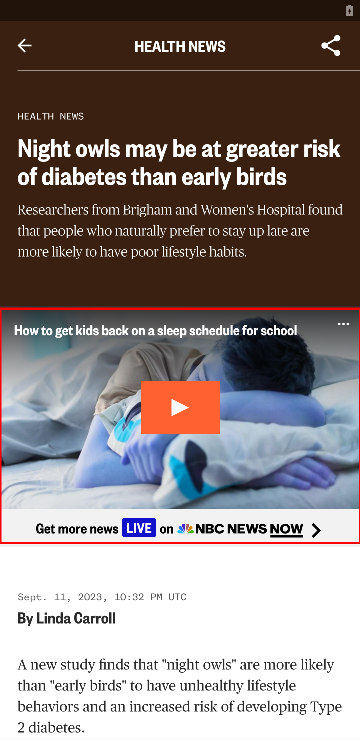

############

##  Obstruction-Currency


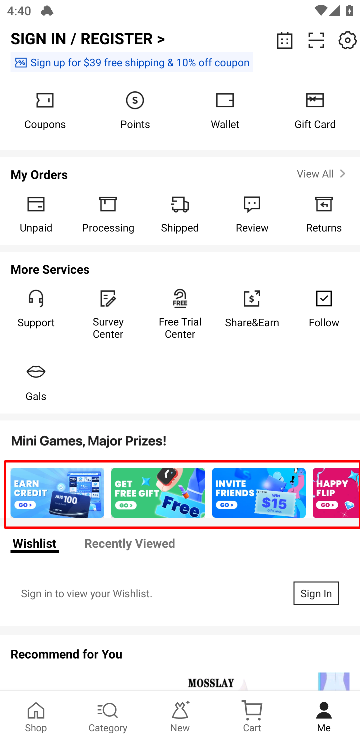

############

##  Nagging


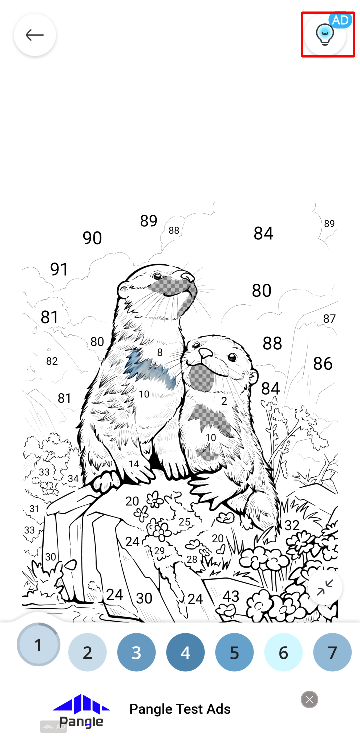

############

##  Obstruction-Currency


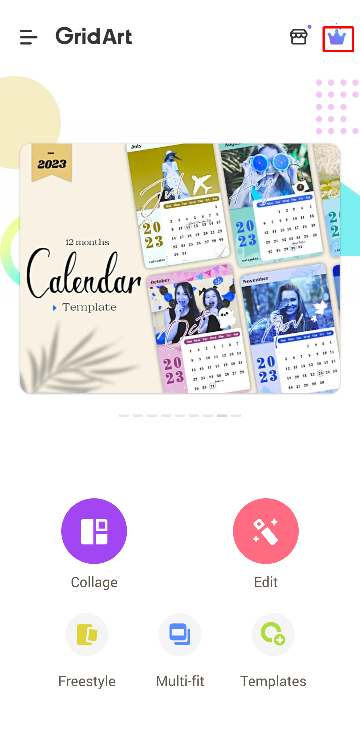

############

##  Sneaking-BaitAndSwitch


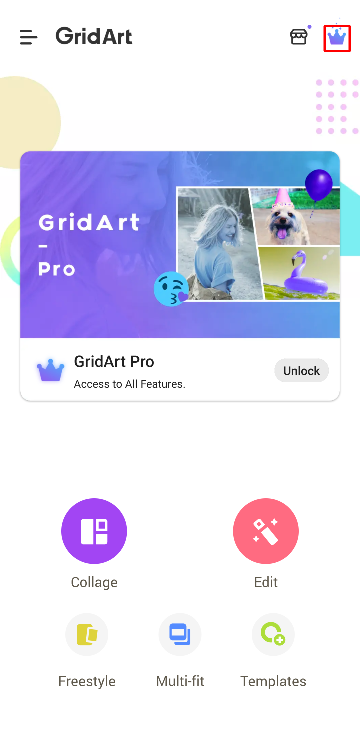

############

##  II-AM-General


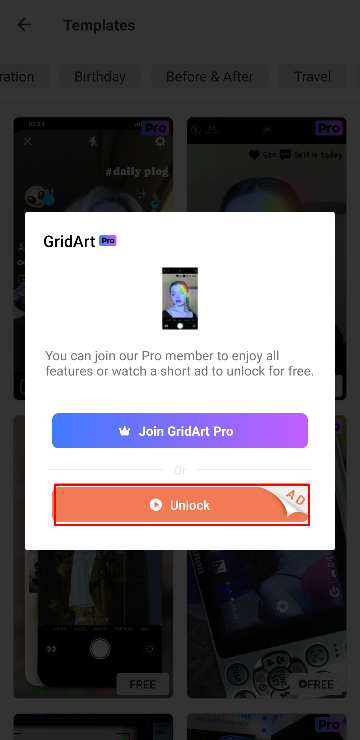

############

##  Nagging


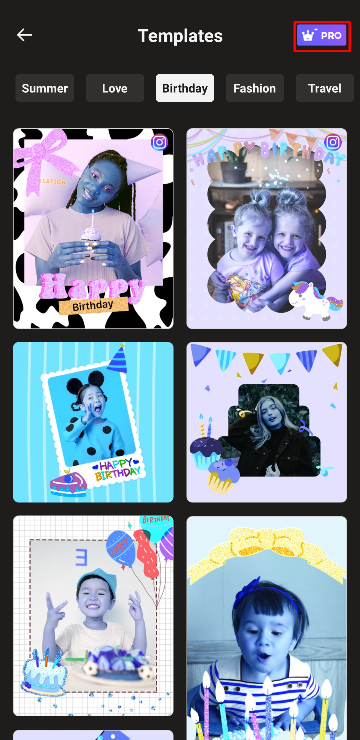

############

##  Nagging


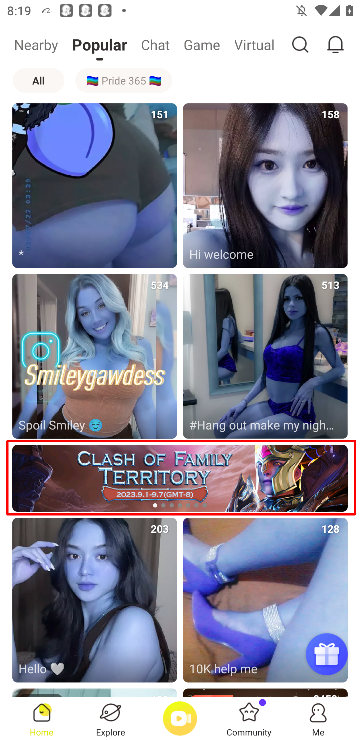

############

##  Nagging


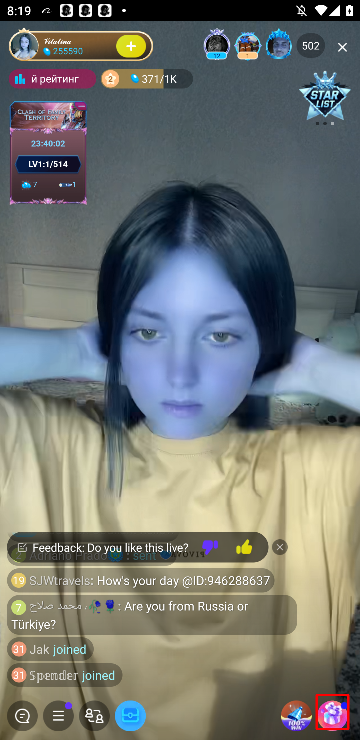

############

##  Nagging


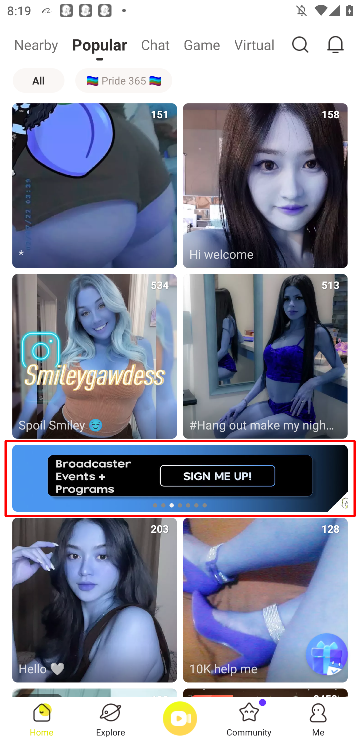

############

##  Nagging


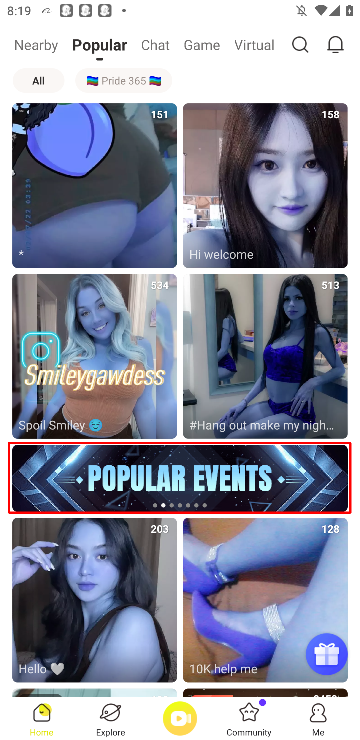

############

##  ForcedAction-General


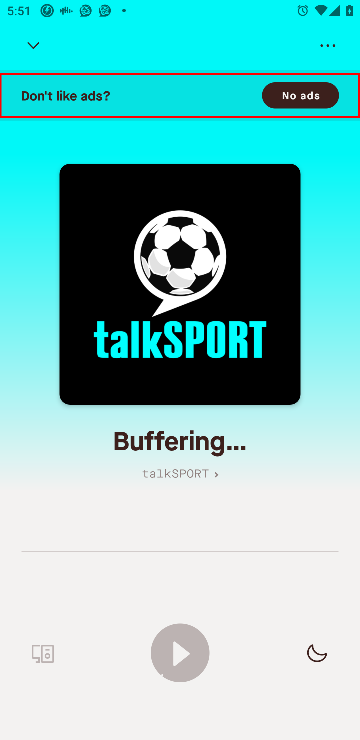

############



In [13]:
print_err_img('II-AM-DisguisedAD', 100)

##  Sneaking-ForcedContinuity


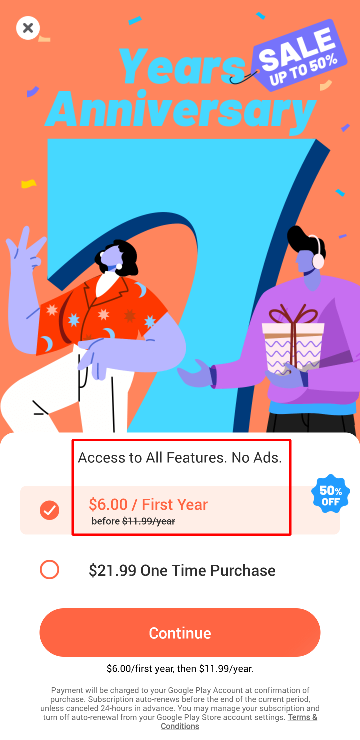

############

##  Sneaking-ForcedContinuity


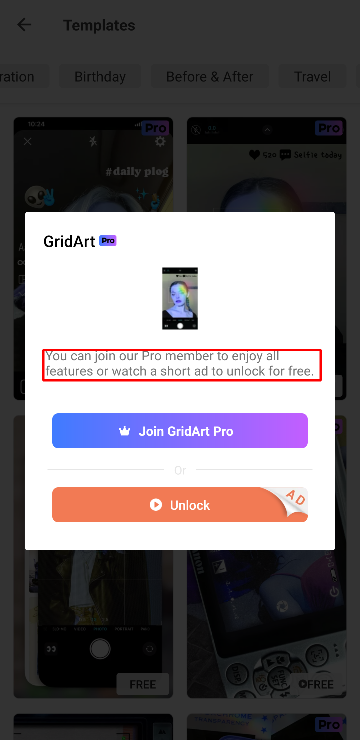

############

##  Nagging


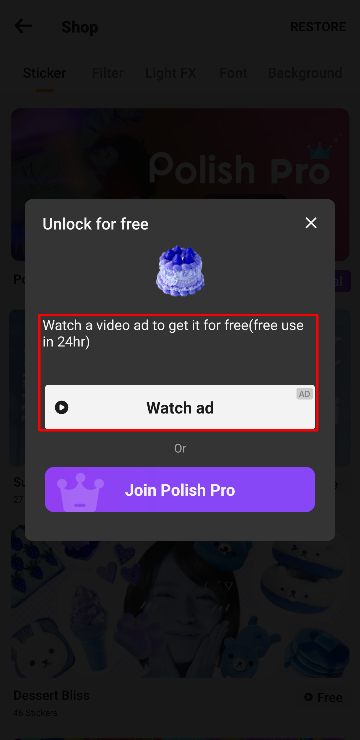

############

##  II-Preselection


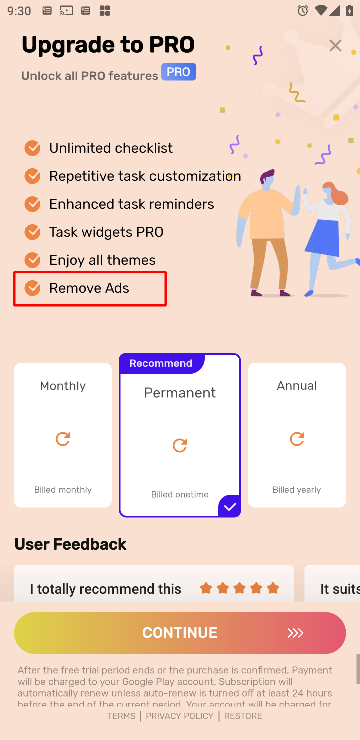

############



In [17]:
print_err_img('ForcedAction-General', 100)

##  II-HiddenInformation


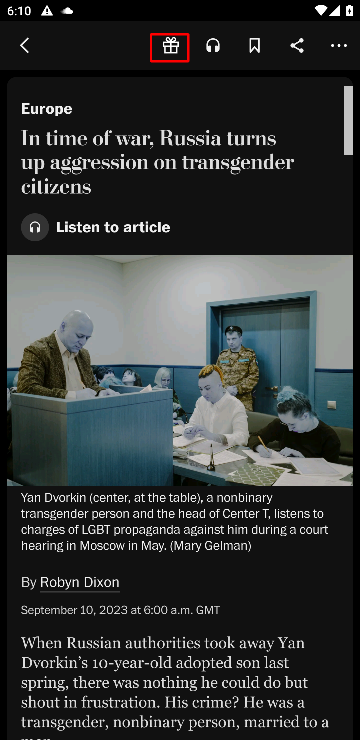

############

##  ForcedAction-General


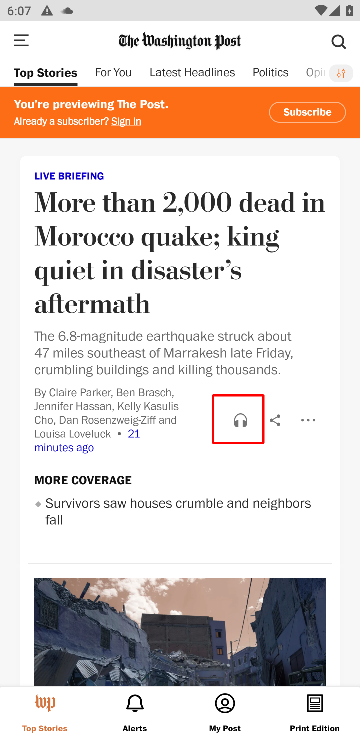

############

##  ForcedAction-General


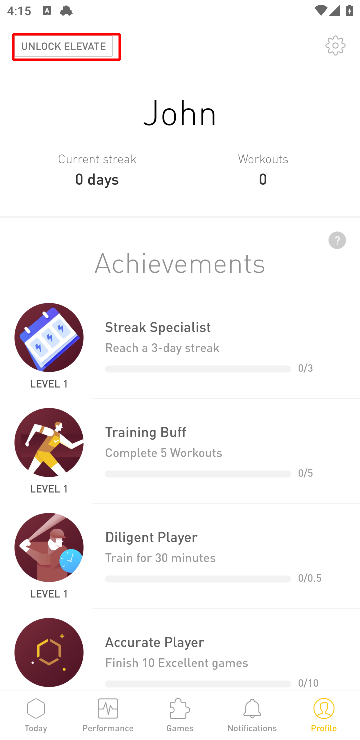

############

##  II-AM-General


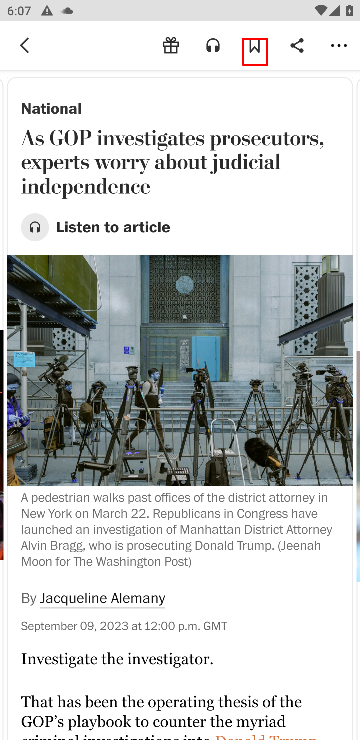

############

##  II-AM-General


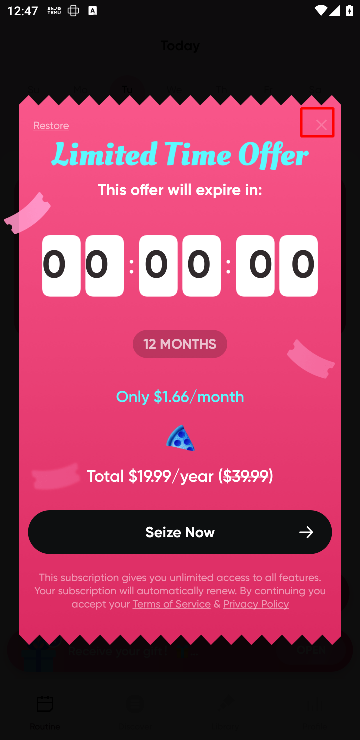

############

##  II-Preselection


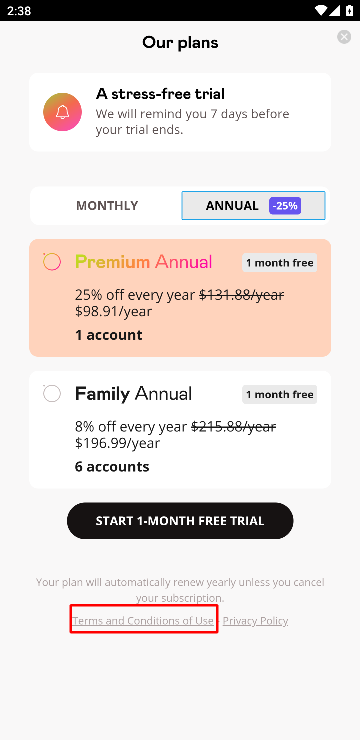

############

##  II-Preselection


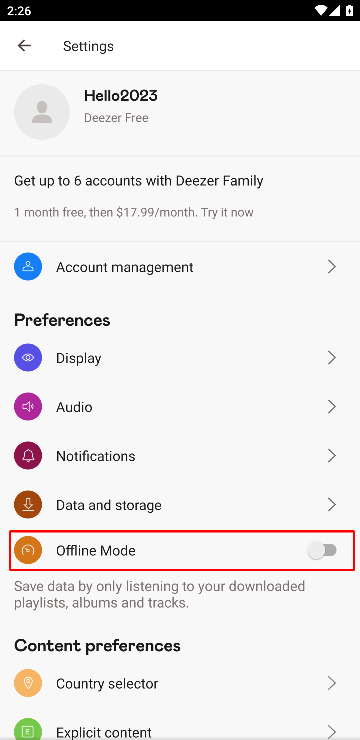

############

##  Nagging


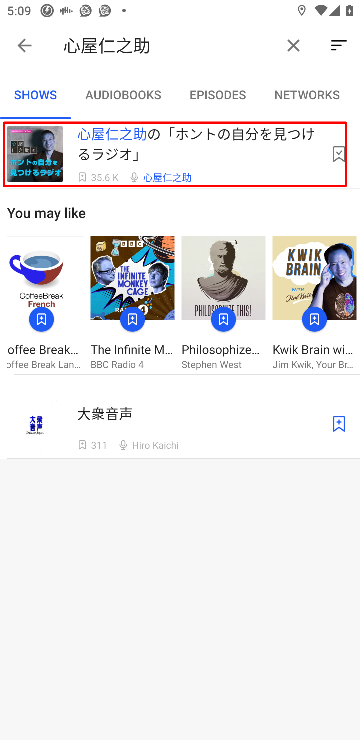

############

##  II-Preselection


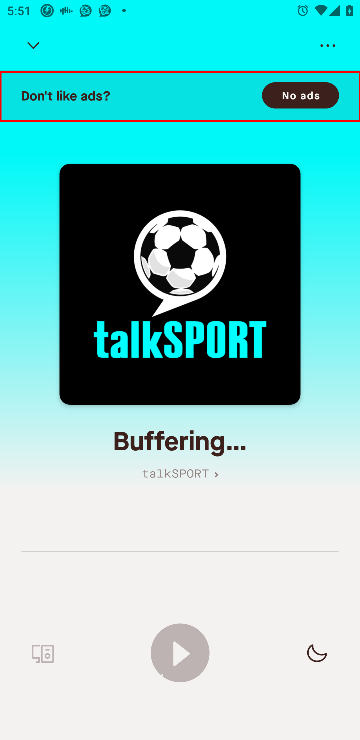

############



In [18]:
print_err_img('Sneaking-BaitAndSwitch', 100)

##  ForcedAction-General
The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


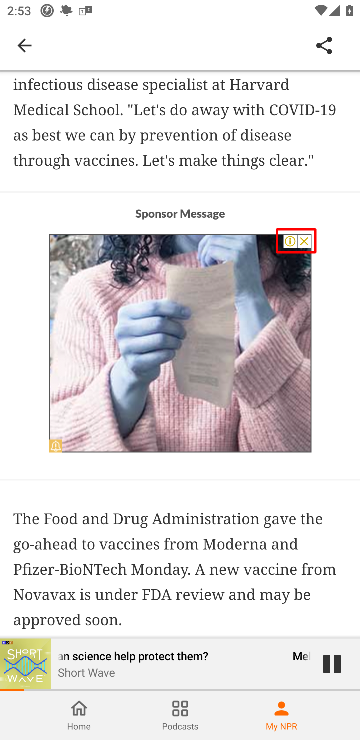

############

##  II-Preselection


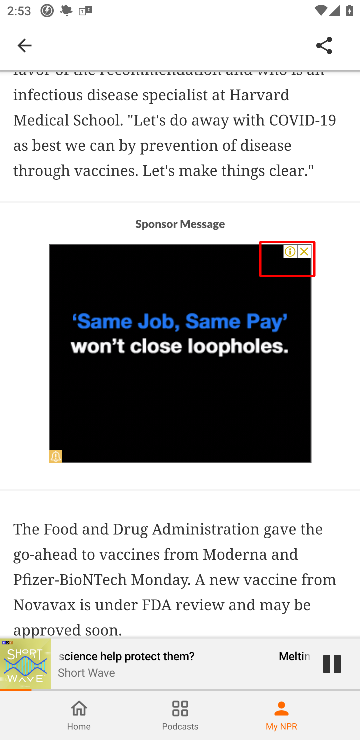

############

##  ForcedAction-General


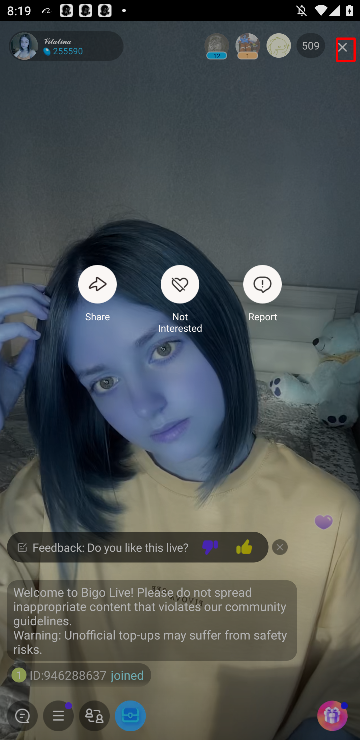

############



In [19]:
print_err_img('II-AM-General', 100)

##  II-HiddenInformation


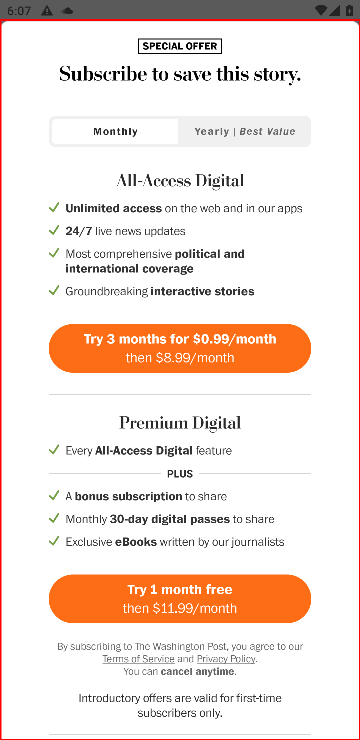

############

##  II-AM-ToyingWithEmotion


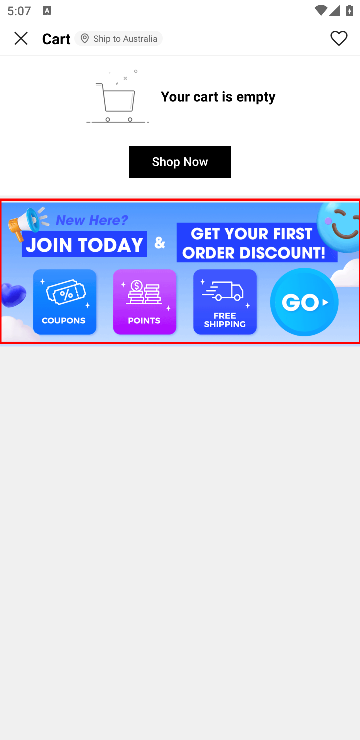

############

##  ForcedAction-Gamification


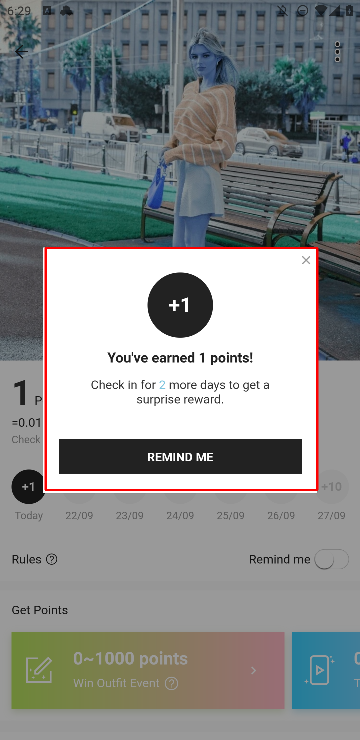

############

##  II-HiddenInformation


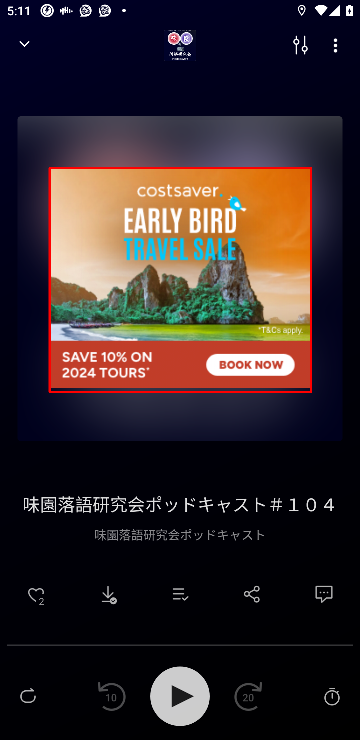

############

##  Sneaking-BaitAndSwitch


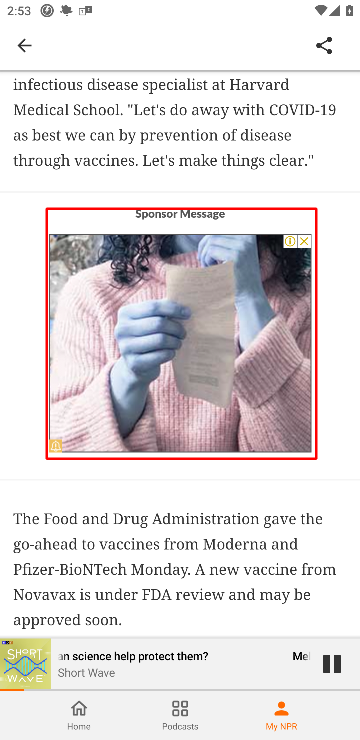

############

##  II-Preselection


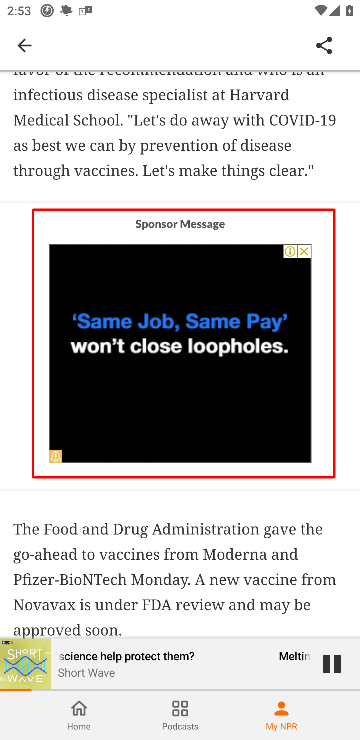

############

##  II-HiddenInformation


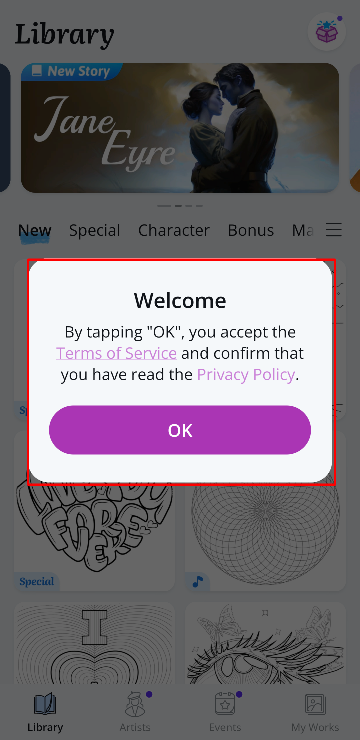

############

##  ForcedAction-General


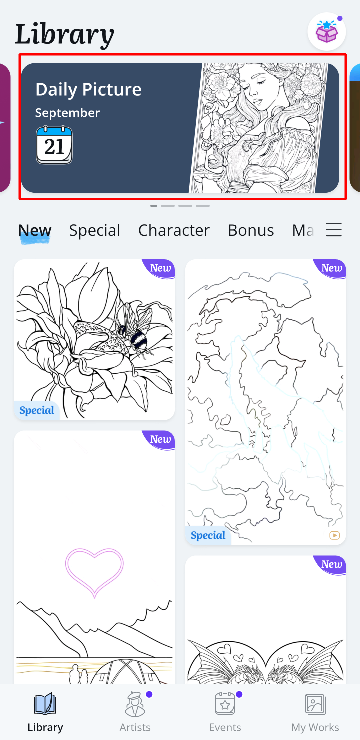

############

##  II-AM-FalseHierarchy-BAD


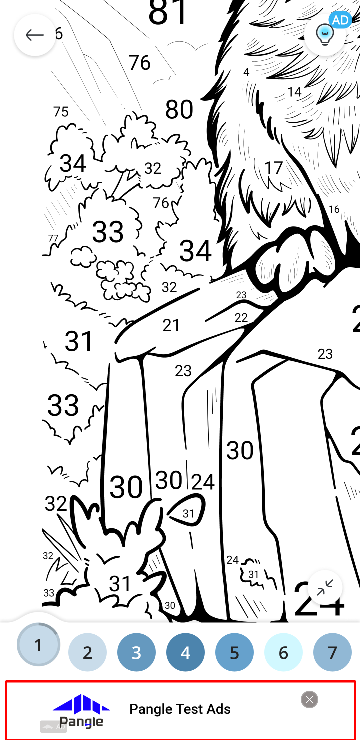

############

##  II-HiddenInformation


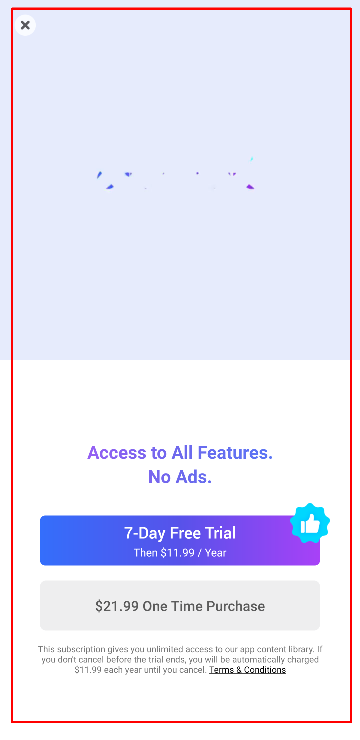

############

##  ForcedAction-General


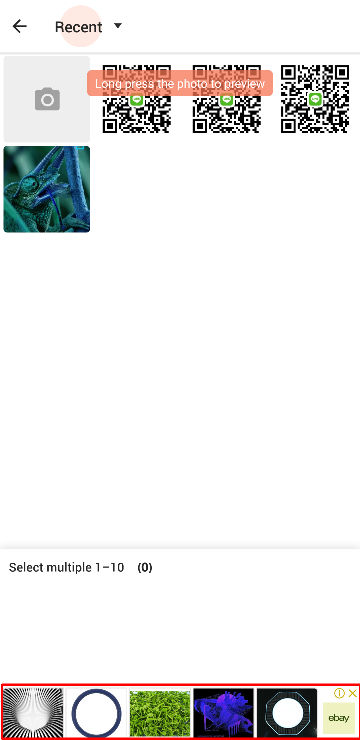

############

##  ForcedAction-General


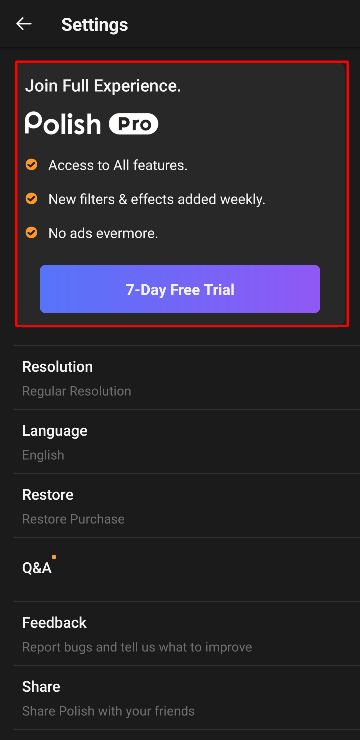

############

##  II-AM-DisguisedAD


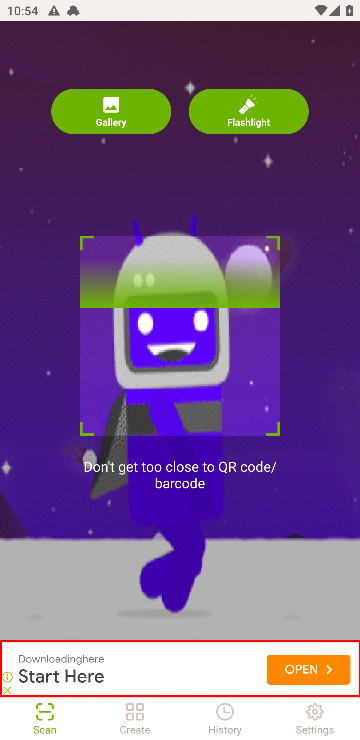

############

##  ForcedAction-General


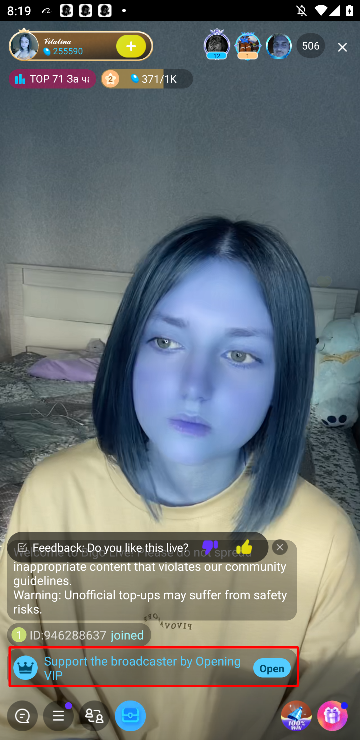

############

##  ForcedAction-Privacy


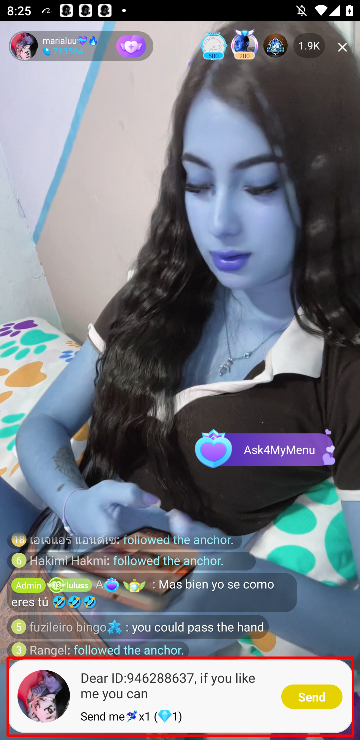

############



In [16]:
print_err_img('Nagging', 100)

##  II-HiddenInformation


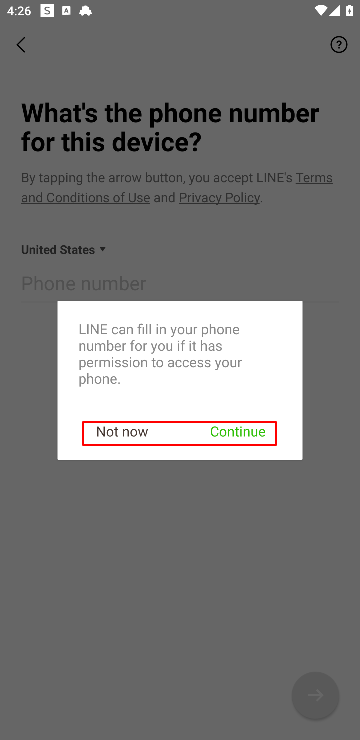

############

##  Obstruction-Currency


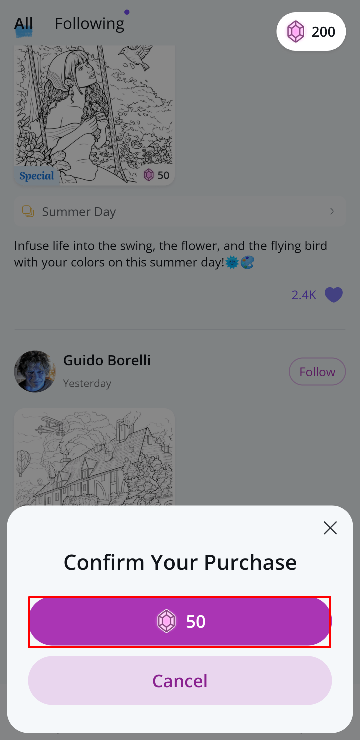

############

##  ForcedAction-General


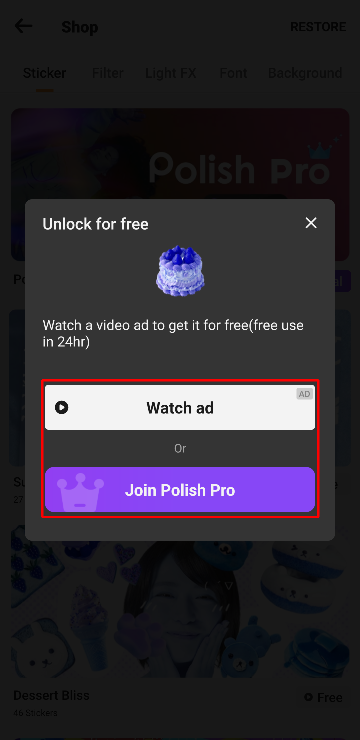

############



In [20]:
print_err_img('II-AM-FalseHierarchy-BAD', 100)

In [ ]:
print_err_img('II-AM-ToyingWithEmotion', 100)